In [2]:
import tensorflow as tf
import sys
import os
import matplotlib.pyplot as plt
import numpy as np
import time
from tqdm import tqdm_notebook as tqdm
tf.compat.v1.enable_eager_execution()


In [25]:
L_embed = 6
input_dims = 2
output_dims = 3 * 4
hlayer_width = 128
hlayer_count = 16

def load_image(path, width, height):
  # read the image file
  image = tf.read_file(path)
  # decode the image string
  image = tf.image.decode_jpeg(image, 3)
  # convert the image dtype from uint8 to float32
  image = tf.image.convert_image_dtype(image, dtype=tf.float32)
  # resize the image to the height and width specified
  image = tf.image.resize(image, (width, height))
  return image

class PaddedOutput(tf.keras.layers.Layer):
    def __init__(self,**kwargs):
        super(PaddedOutput, self).__init__(**kwargs)
        self.units = 16

    def build(self, input_shape):
        self.w = self.add_weight(
            shape=(hlayer_width, output_dims),
            initializer="random_normal",
            trainable=True,
        )
        self.w_padded = self.add_weight(
            shape=(hlayer_width, 16 - output_dims),
            initializer="zeros",
            trainable=False,
        )
        super(PaddedOutput, self).build(input_shape)

    def call(self, inputs):
        return tf.matmul(inputs, tf.concat([self.w, self.w_padded], 1))

    def get_weights(self):
        return [tf.concat([self.w, self.w_padded], 1)]

def posenc(x):
  rets = [x]
  for i in range(L_embed):
    for fn in [tf.sin, tf.cos]:
      rets.append(fn(2.**i * x))
  return tf.concat(rets, -1)

def init_model():
    relu = tf.keras.layers.ReLU()

    def dense(W=hlayer_width, act=relu): return tf.keras.layers.Dense(
        W, use_bias=False, activation=act)

    inputs = tf.keras.Input(shape=(input_dims + input_dims*2*L_embed))
    outputs = inputs
    for i in range(hlayer_count):
        outputs = dense()(outputs)
    outputs = PaddedOutput()(outputs)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    print(model.summary())
    return model



Model: "model_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 26)]              0         
_________________________________________________________________
dense_144 (Dense)            (None, 128)               3328      
_________________________________________________________________
dense_145 (Dense)            (None, 128)               16384     
_________________________________________________________________
dense_146 (Dense)            (None, 128)               16384     
_________________________________________________________________
dense_147 (Dense)            (None, 128)               16384     
_________________________________________________________________
dense_148 (Dense)            (None, 128)               16384     
_________________________________________________________________
dense_149 (Dense)            (None, 128)               163

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


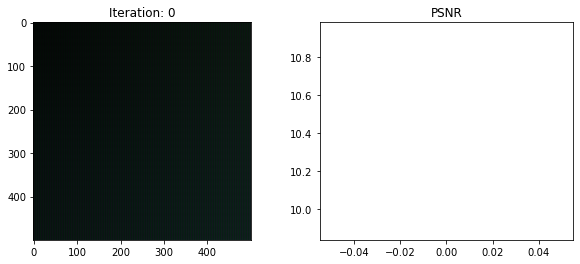

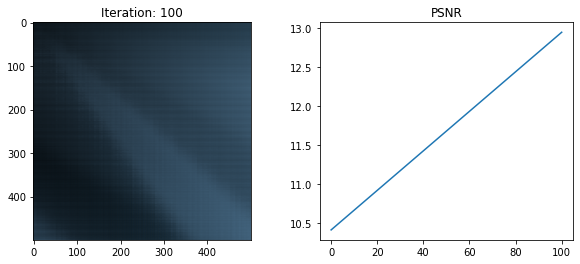

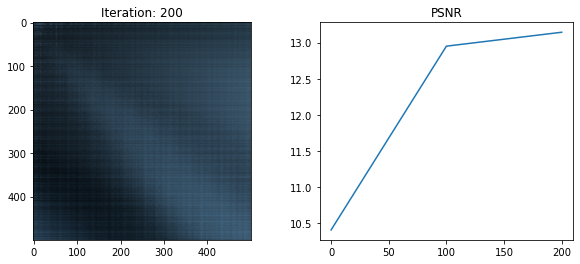

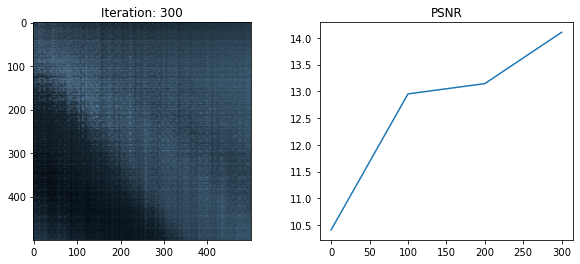

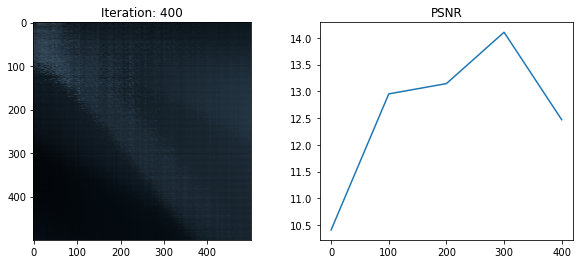

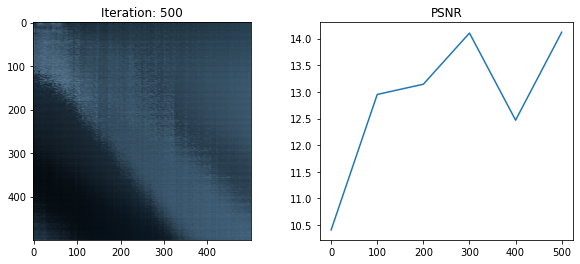

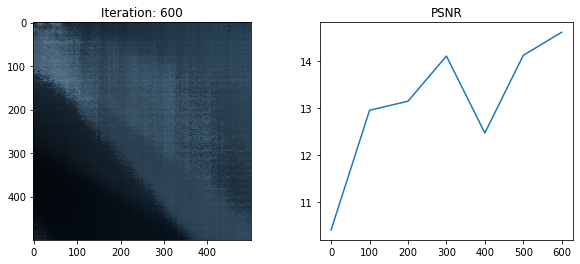

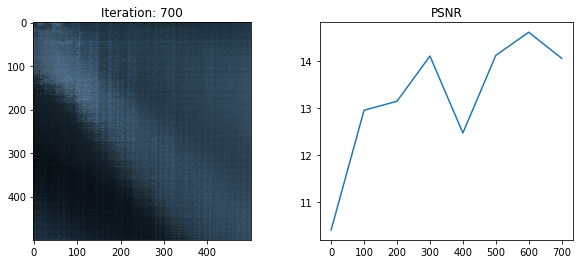

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


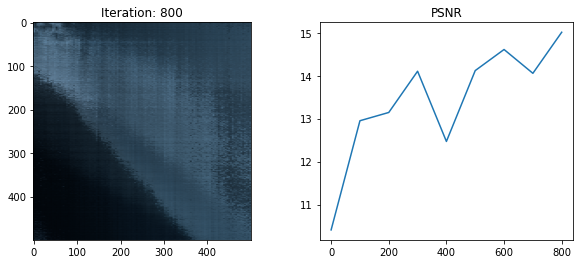

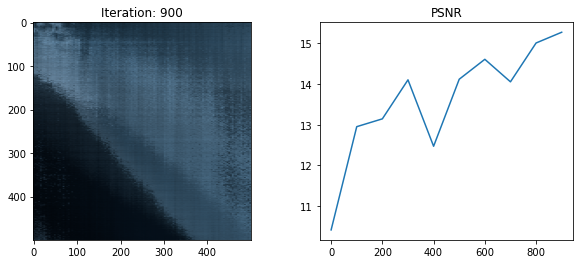

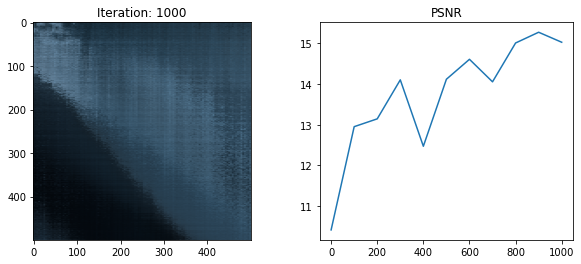

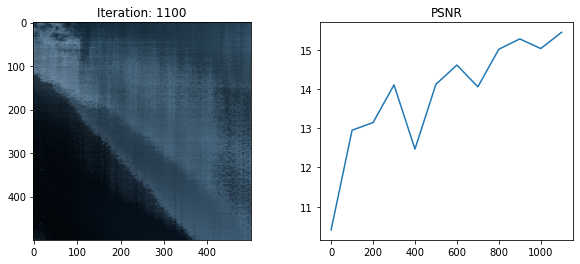

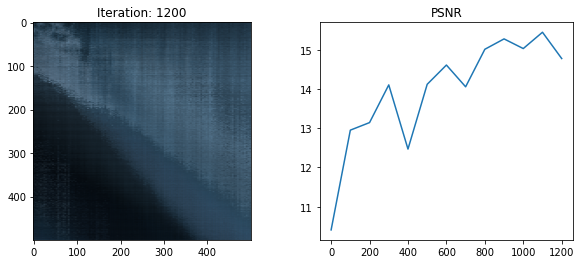

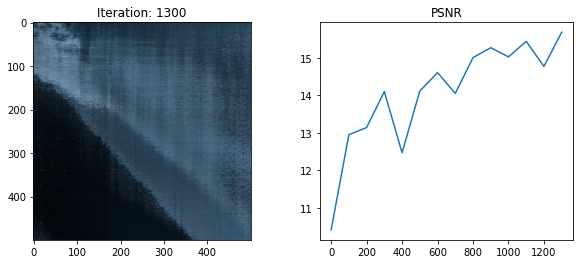

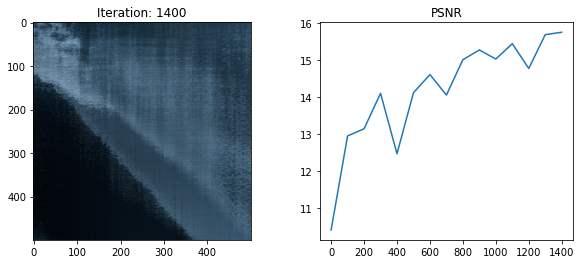

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


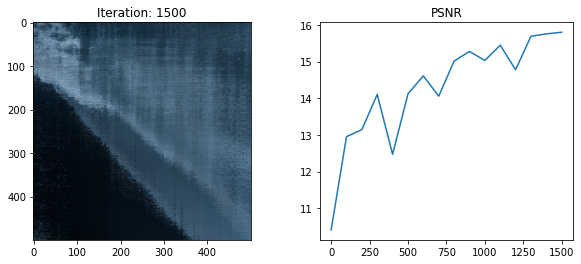

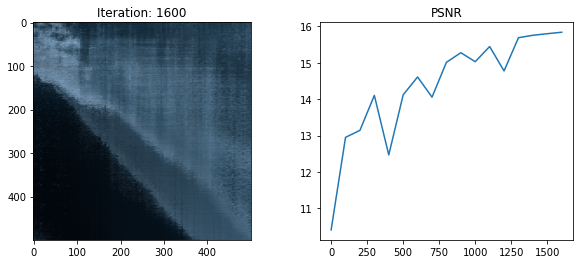

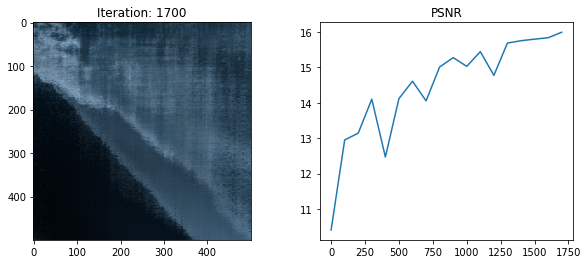

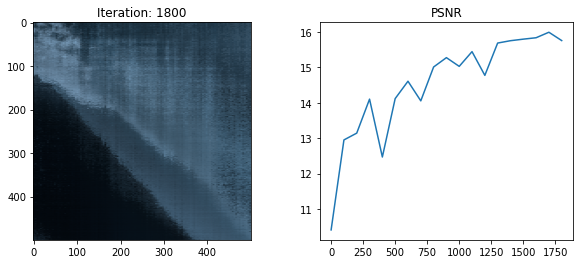

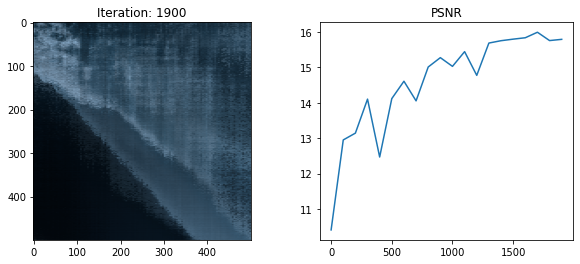

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


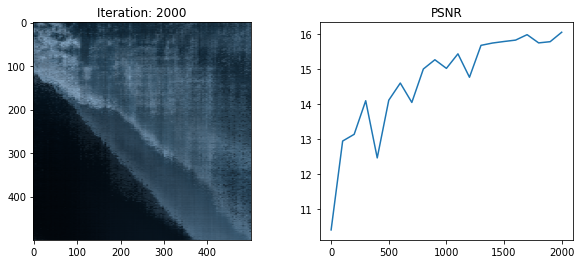

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


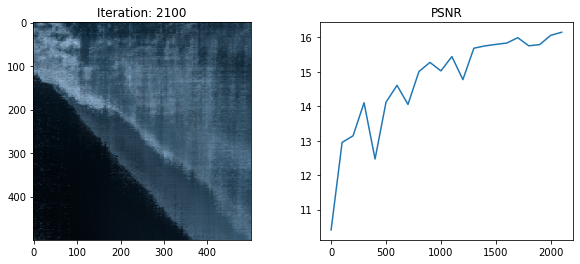

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


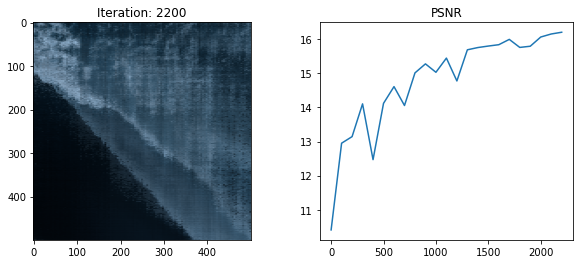

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


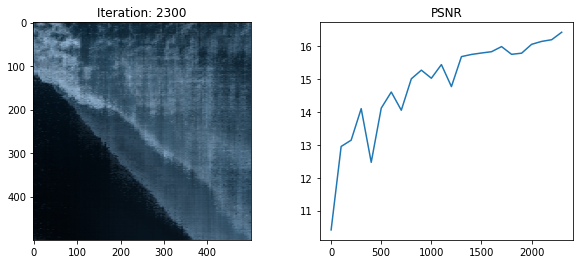

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


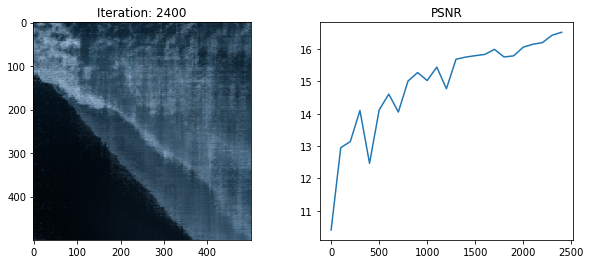

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


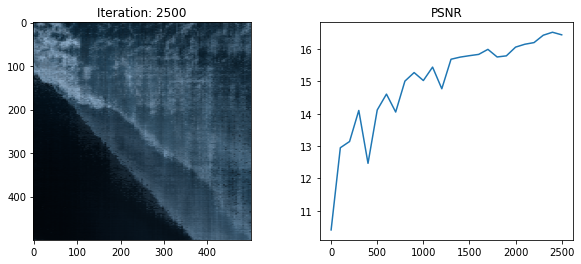

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


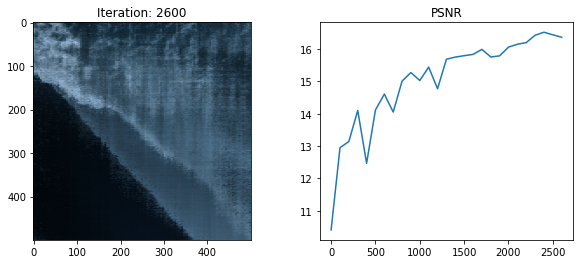

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


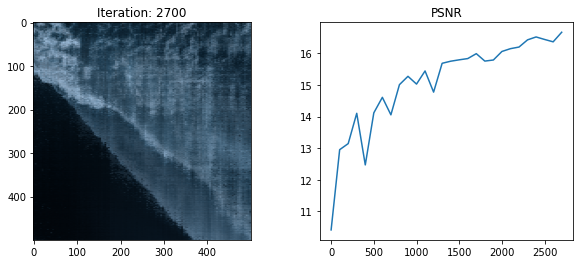

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


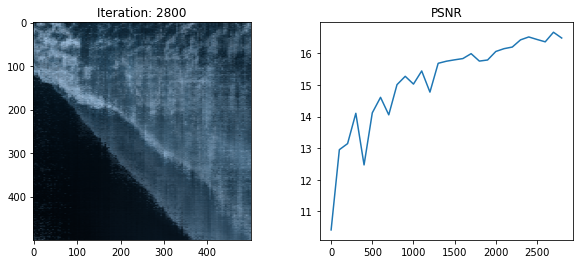

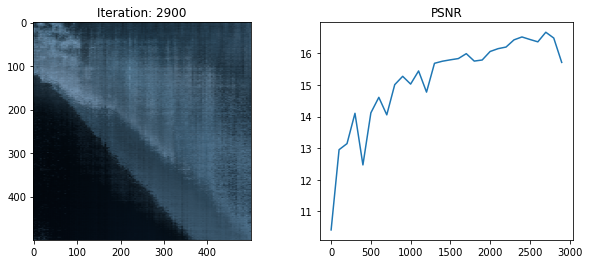

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


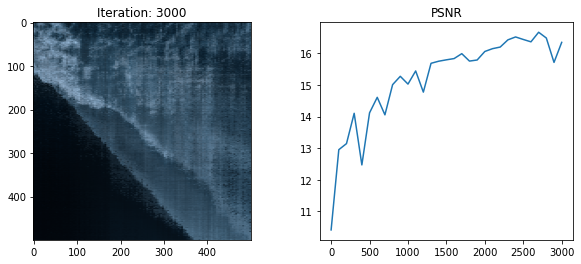

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


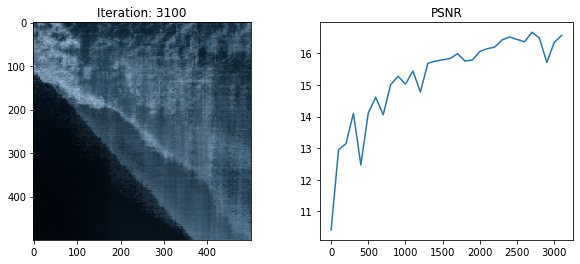

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


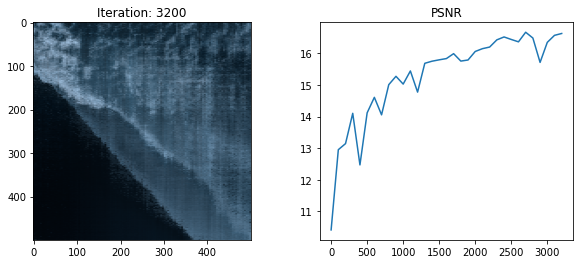

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


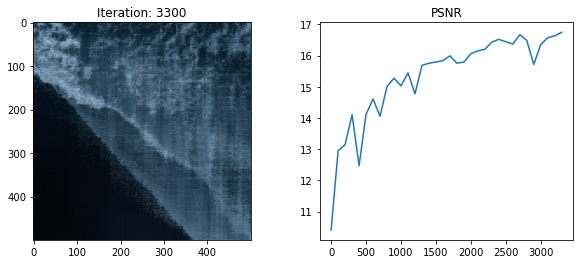

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


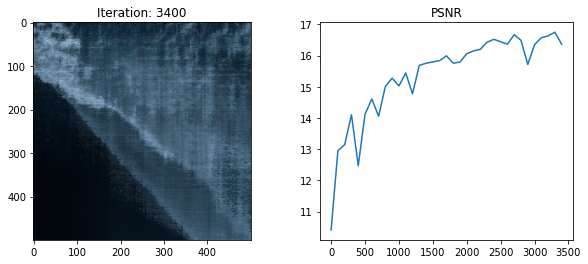

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


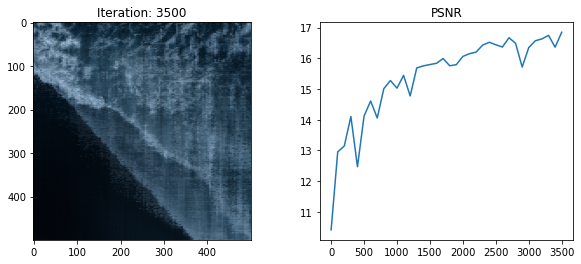

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


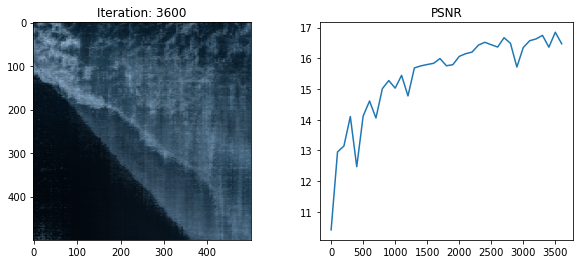

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


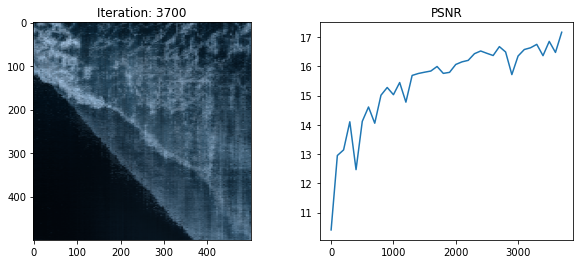

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


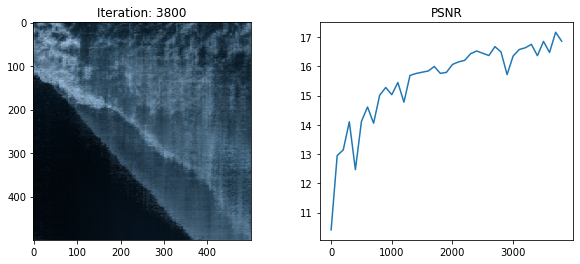

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


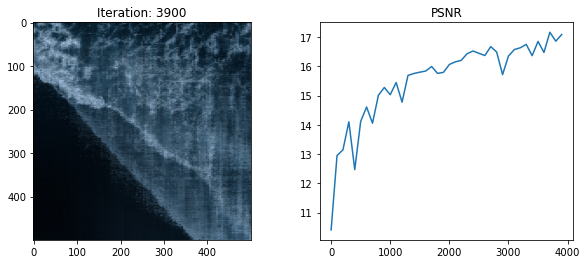

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


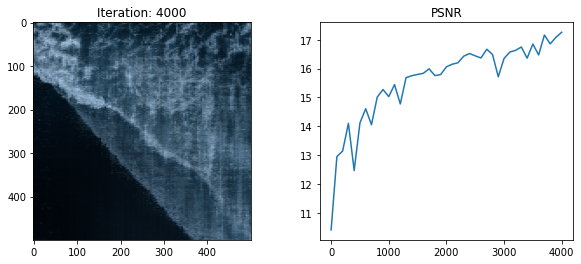

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


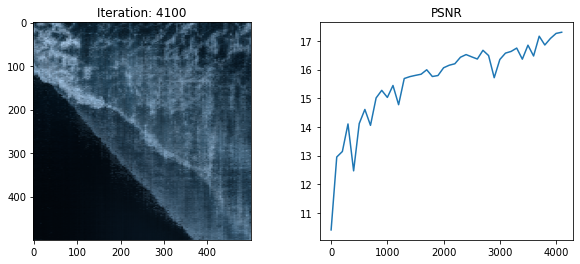

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


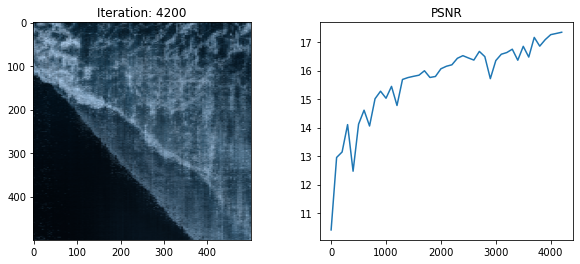

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


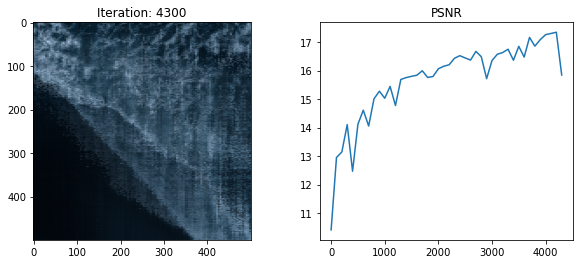

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


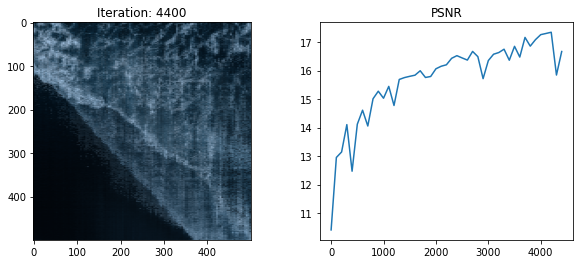

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


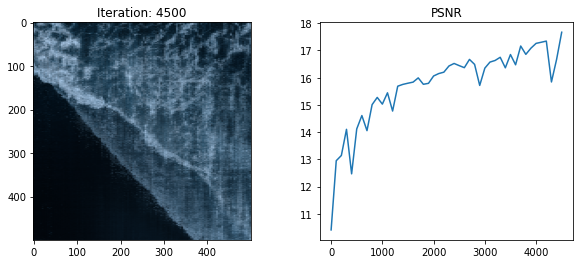

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


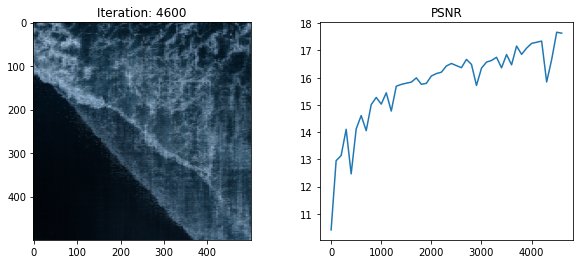

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


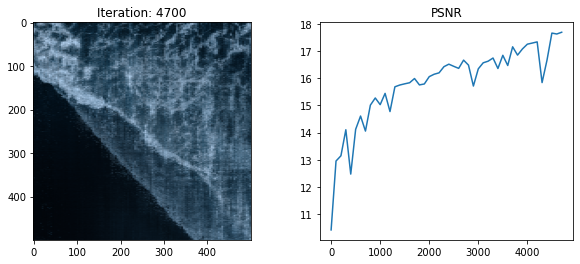

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


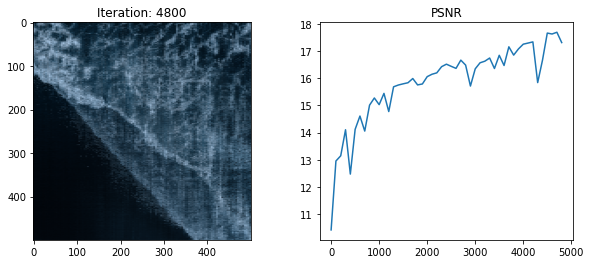

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


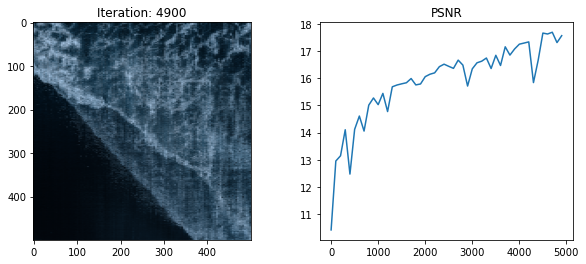

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


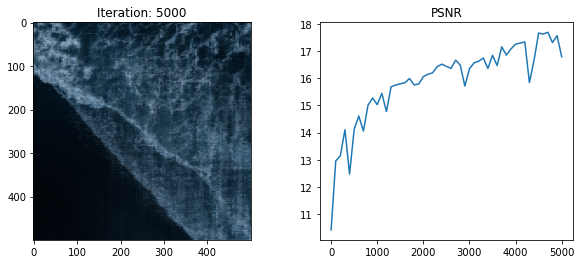

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


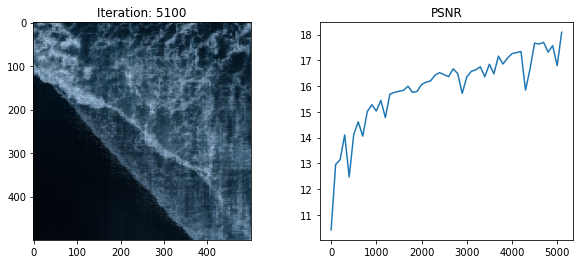

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


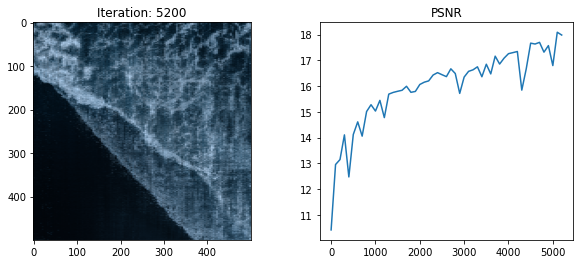

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


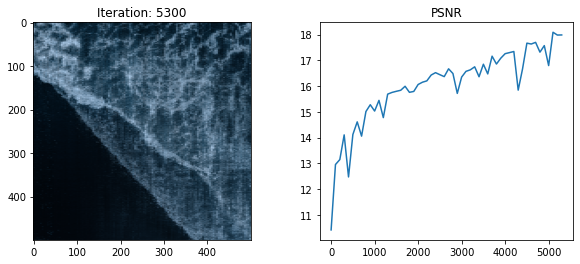

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


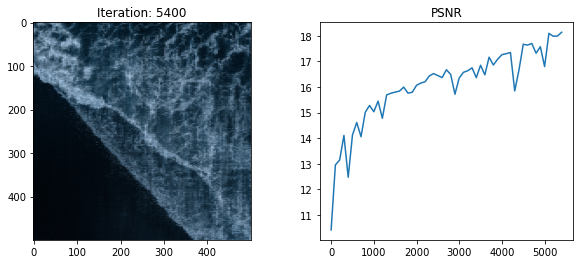

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


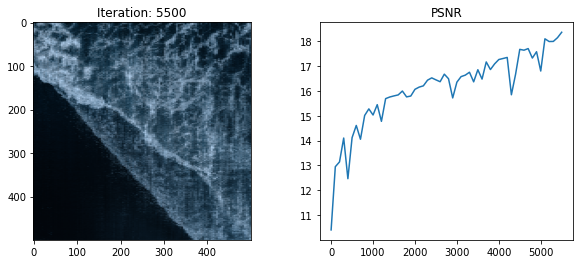

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


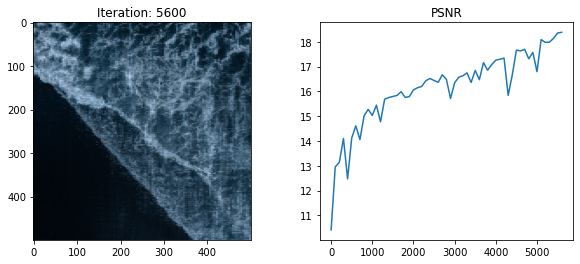

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


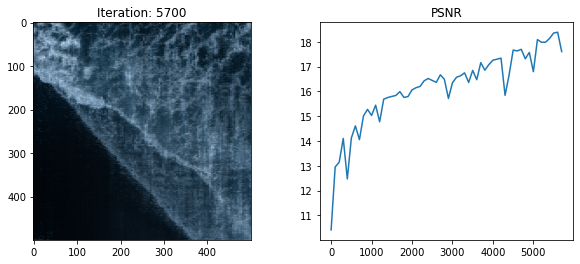

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


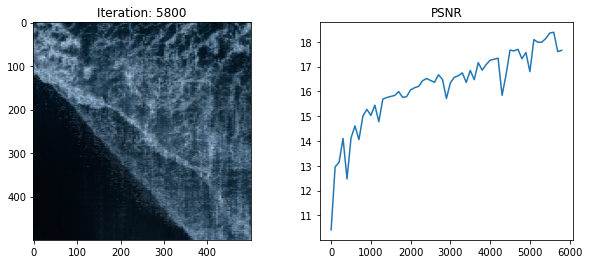

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


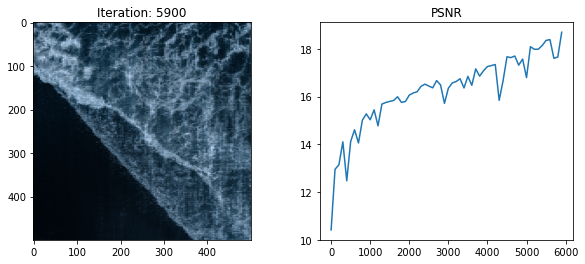

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


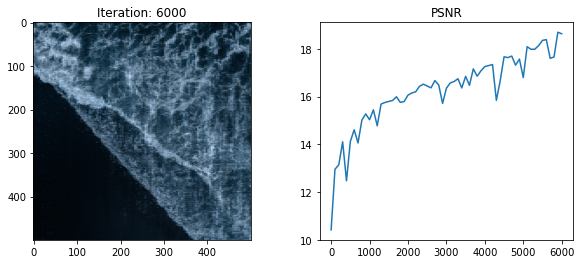

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


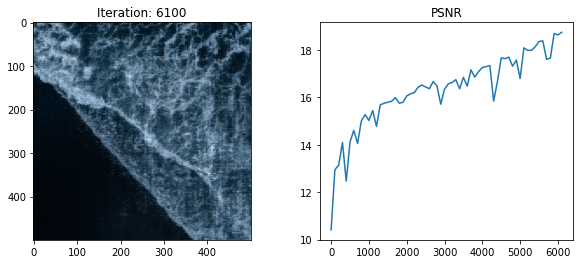

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


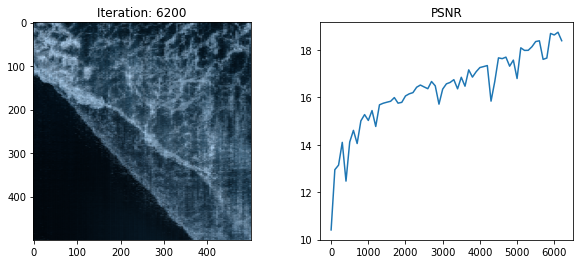

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


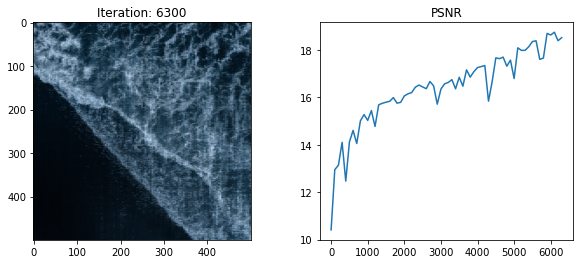

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


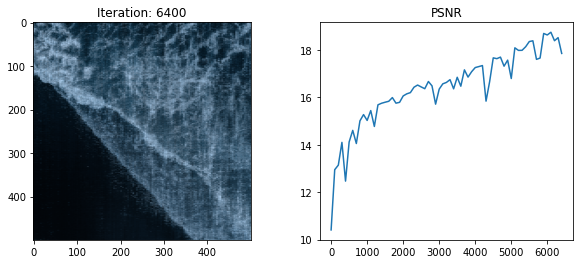

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


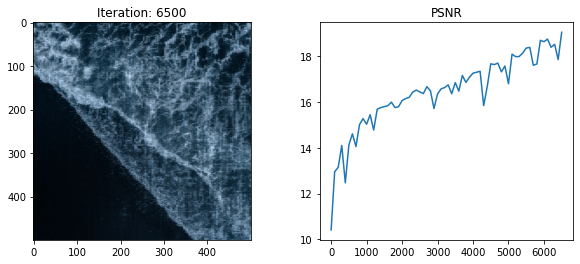

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


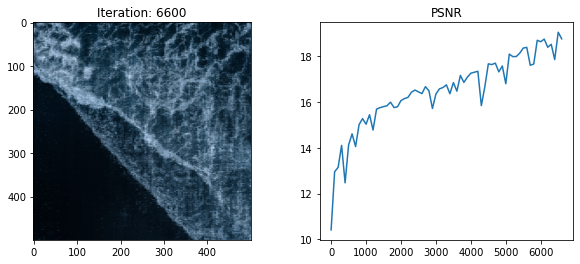

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


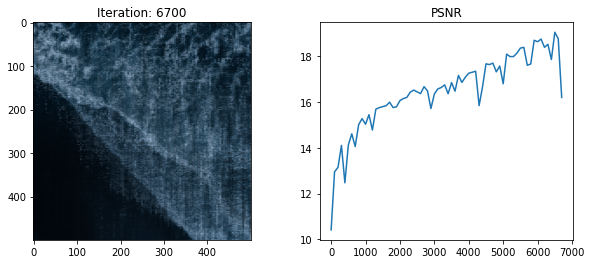

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


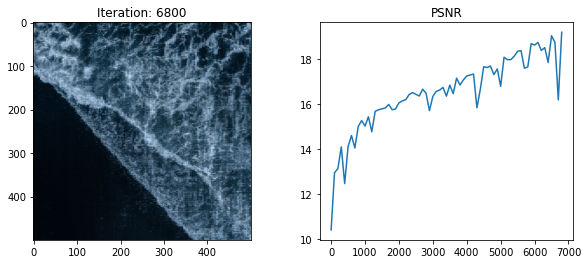

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


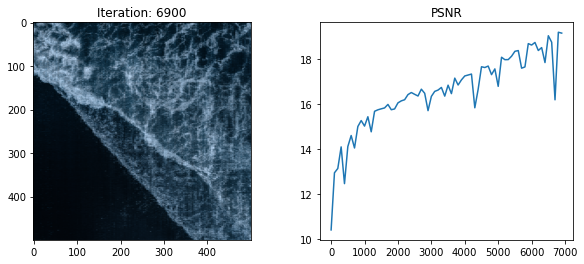

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


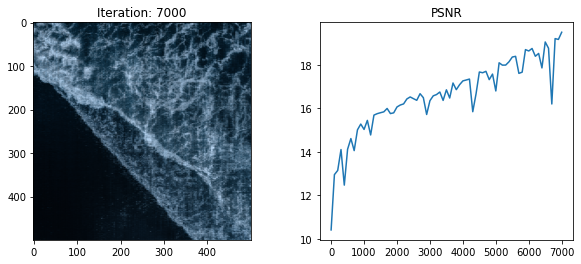

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


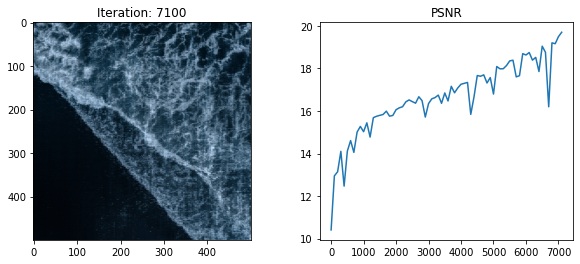

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


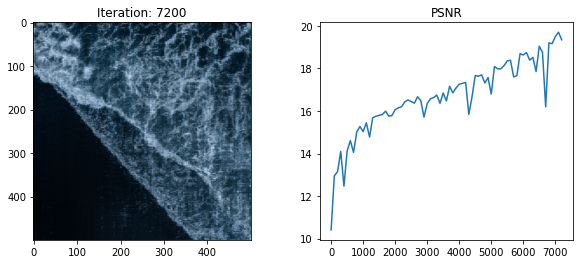

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


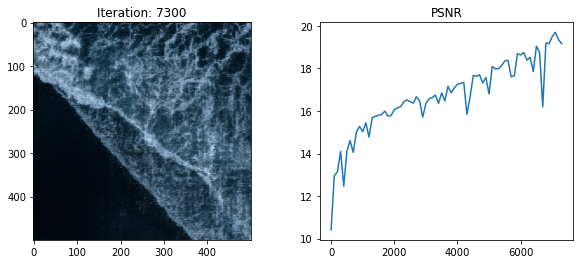

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


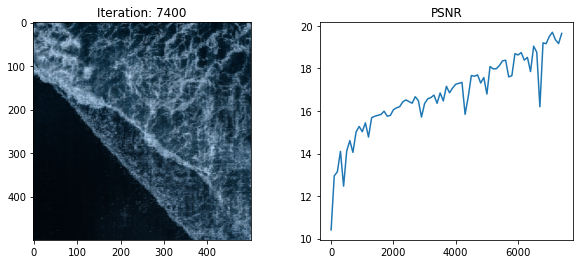

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


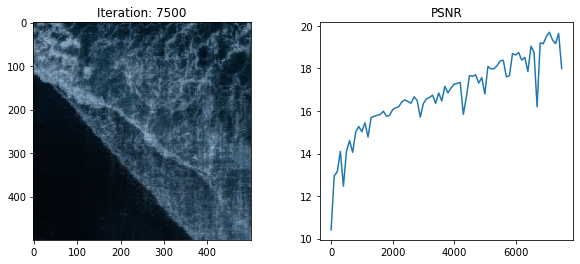

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


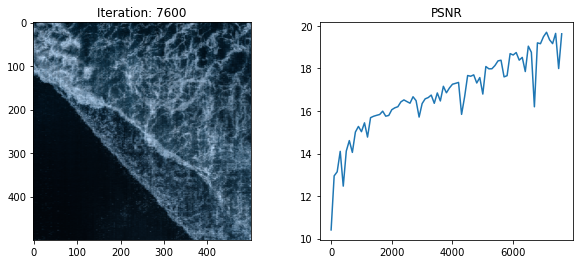

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


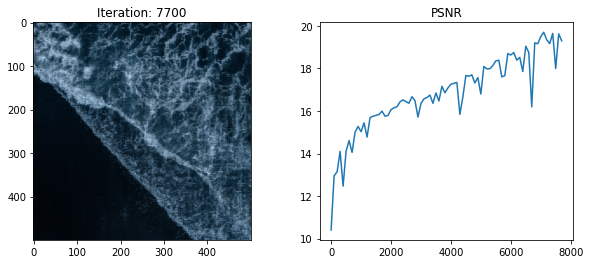

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


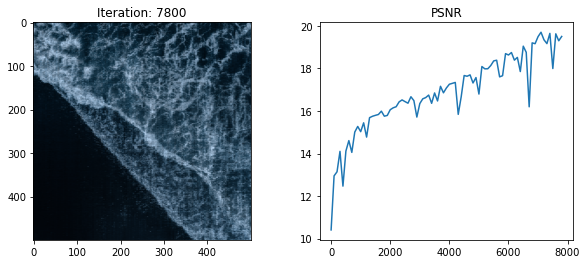

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


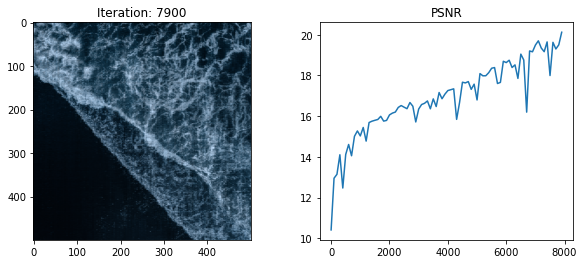

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


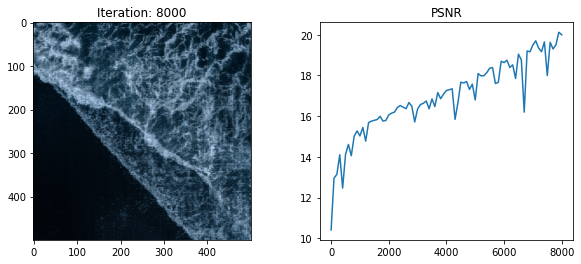

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


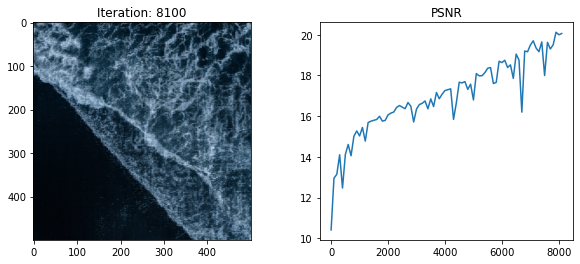

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


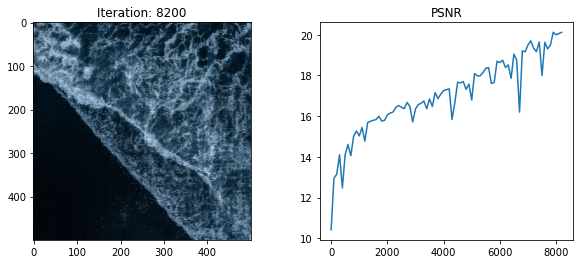

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


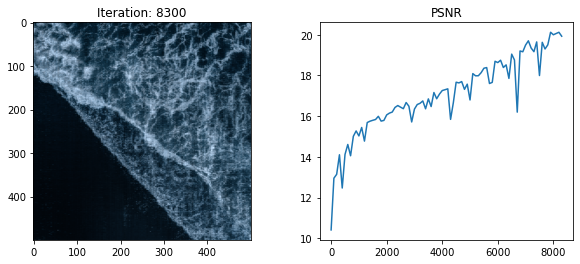

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


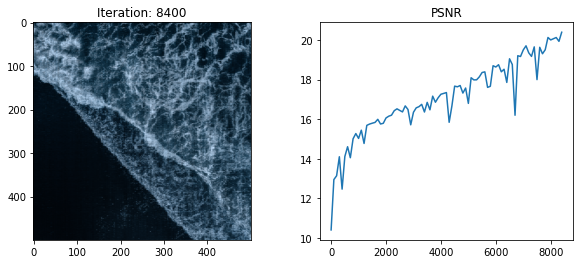

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


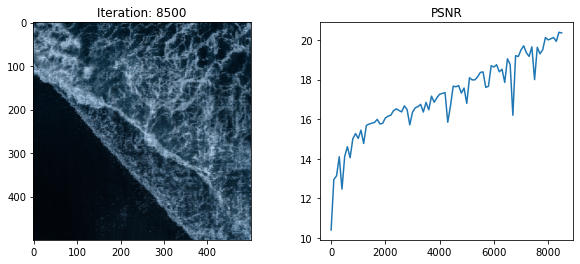

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


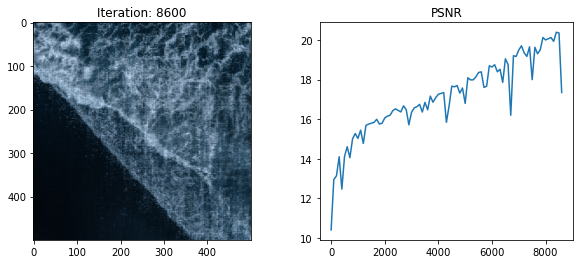

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


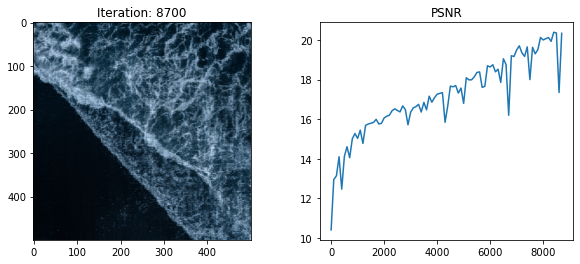

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


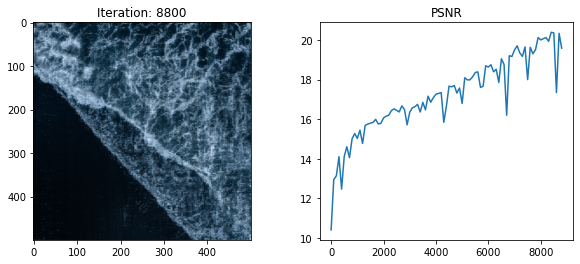

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


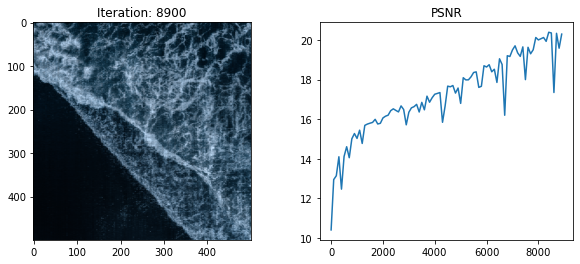

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


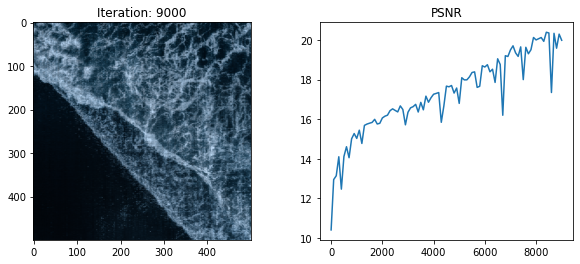

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


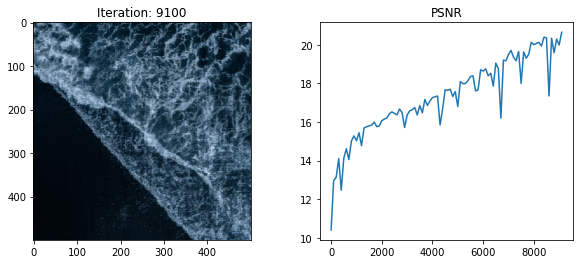

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


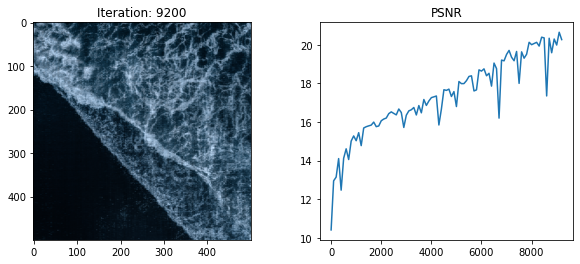

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


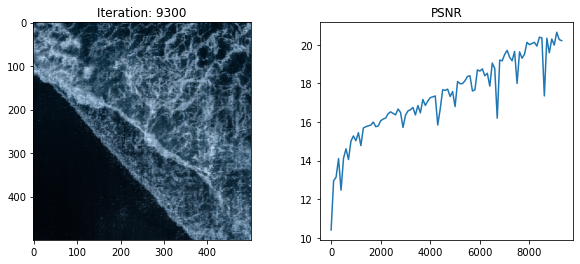

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


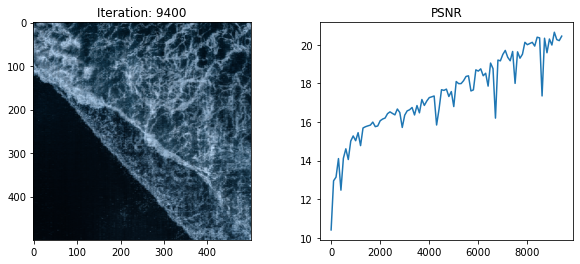

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


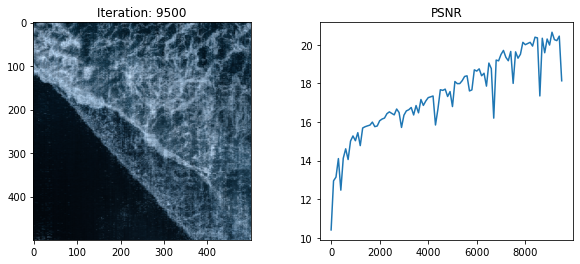

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


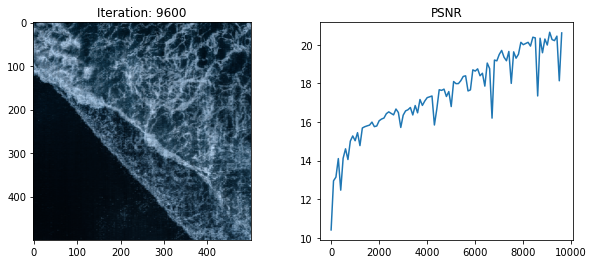

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


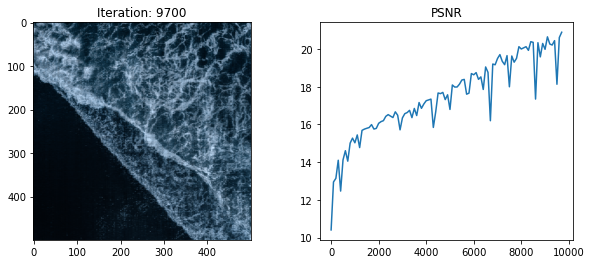

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


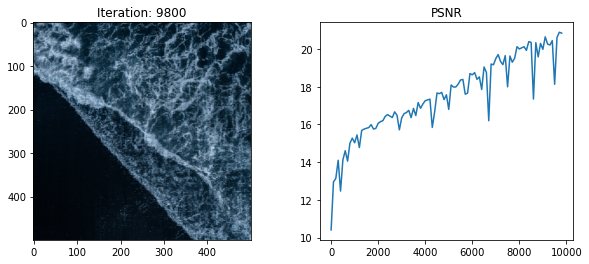

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


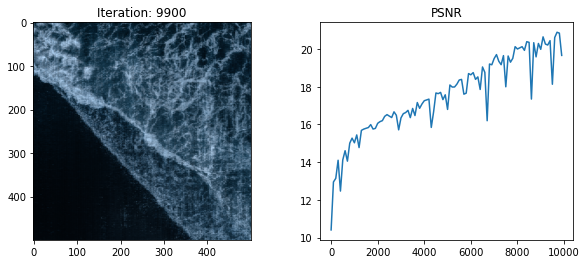

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


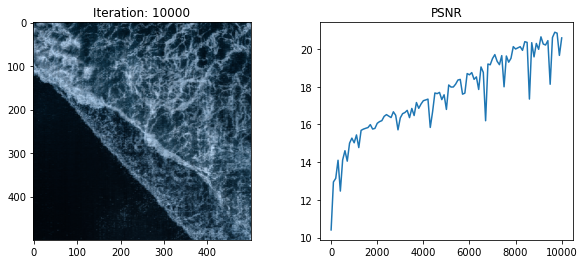

In [26]:
# Shrinking by factor of 4
high_res = load_image("../datasets/wave/wave.png", 500, 500)
low_res = load_image("../datasets/wave/wave.png", 250, 250)

scale = 2
# map the (x, y) pixel coordinates in low_res to their corresponding values in high_res

model = init_model()
optimizer = tf.keras.optimizers.Adam(5e-4)

N_iters = 10000
psnrs = []
iternums = []
i_plot = 100


def lres_ind_to_hres_ind(x, y, scale=2):
    scale_factor = 2
    x2 = int(x * scale_factor)
    y2 = int(y * scale_factor)

    return [(x2, y2),
            (x2 + 1, y2),
            (x2, y2 + 1),
            (x2 + 1, y2 + 1)]


def xs_and_ys(width, height):
    res = []
    for y in range(height):
        for x in range(width):
            res.append((y, x))
    return np.array(res)


def infer():
    def batchify(fn, chunk=1024*32):
        return lambda inputs: tf.concat([
            fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], 0)

    pts = posenc(xs_and_ys(low_res.shape[0], low_res.shape[1]))
    output = batchify(model)(pts)
    # Remember: this isnt right layout
    return tf.reshape(output[:, :12], (high_res.shape[0], high_res.shape[1], 3))


def train():
    for i in range(N_iters+1):
        # select random pixel (x, y)

        with tf.GradientTape() as tape:
            rgbs = infer()
            loss = tf.reduce_mean(tf.square(rgbs - high_res))

        gradients = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))

        if i % i_plot == 0:
            rgbs = infer()
            loss = tf.reduce_mean(tf.square(rgbs - high_res))
            psnr = -10. * tf.math.log(loss) / tf.math.log(10.)

            psnrs.append(psnr.numpy())
            iternums.append(i)

            plt.figure(figsize=(10, 4))
            plt.subplot(121)
            plt.imshow(rgbs)
            plt.title(f'Iteration: {i}')
            plt.subplot(122)
            plt.plot(iternums, psnrs)
            plt.title('PSNR')
            plt.show()


train()

